In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

import plotly.express as px

In [ ]:
root_file = '/srv01/agrp/dreyet/cocoa-hep/COCOA/buggy_photon_default.root'

In [2]:
cell_file = '/srv01/agrp/dreyet/cocoa-hep/COCOA/debug_photon_new_default.csv'
### remove lines that contain 'iron'
with open(cell_file, 'r') as f:
    lines = f.readlines()
    lines = [l for l in lines if 'iron' not in l]
    lines = [l for l in lines if 'Iron' not in l]

with open(cell_file, 'w') as f:
    f.writelines(lines)

In [3]:
cell_df = pd.read_csv(cell_file)

In [4]:
# remove rows that contain NaN values
cell_df = cell_df.dropna()

In [31]:
cell_df

,eDep,parentID,volumeName,cellName,XPos,YPos,ZPos,EtaPos,PhiPos,R_Bin,Eta_Bin,Phi_Bin,log(eDep)
0,0.081902,1,ECAL1_1_back_PL_19_256,ECAL1_1_back_PL_19_256,-35.3104,1508.43,-667.137,-0.428882,1.59420,0,109,64,0.851605
1,0.053395,1,ECAL1_1_back_PL_19_256,ECAL1_1_back_PL_19_256,-35.3156,1508.65,-667.233,-0.428882,1.59420,0,109,64,0.837971
2,1.413890,1,ECAL1_1_back_PL_19_256,ECAL1_1_back_PL_19_256,-35.3192,1508.80,-667.301,-0.428882,1.59420,0,109,64,0.942389
3,0.216811,1,ECAL1_1_back_PL_19_256,ECAL1_1_back_PL_19_256,-35.3898,1511.74,-668.602,-0.428881,1.59420,0,109,64,0.882630
4,0.632785,1,ECAL1_1_back_PL_19_256,ECAL1_1_back_PL_19_256,-35.4061,1512.42,-668.903,-0.428881,1.59420,0,109,64,0.916766
...,...,...,...,...,...,...,...,...,...,...,...,...,...
408828,0.683562,235983,ECAL2_1_back_PL_20_2,ECAL2_1_back_PL_20_2,44.0911,1689.94,-805.812,-0.460244,1.54471,1,108,62,0.919226
408829,0.015867,235986,ECAL2_1_back_PL_20_2,ECAL2_1_back_PL_20_2,42.4996,1690.63,-805.801,-0.460074,1.54566,1,108,62,0.799298
408830,0.065752,235988,ECAL2_1_back_PL_20_2,ECAL2_1_back_PL_20_2,42.0622,1690.79,-805.798,-0.460034,1.54592,1,108,62,0.844605
408831,0.088011,235976,ECAL2_1_back_PL_20_2,ECAL2_1_back_PL_20_2,29.8107,1701.90,-792.683,-0.450317,1.55328,1,108,63,0.853898


In [6]:
pixels_per_layer = [256,256,128,64,64,32]

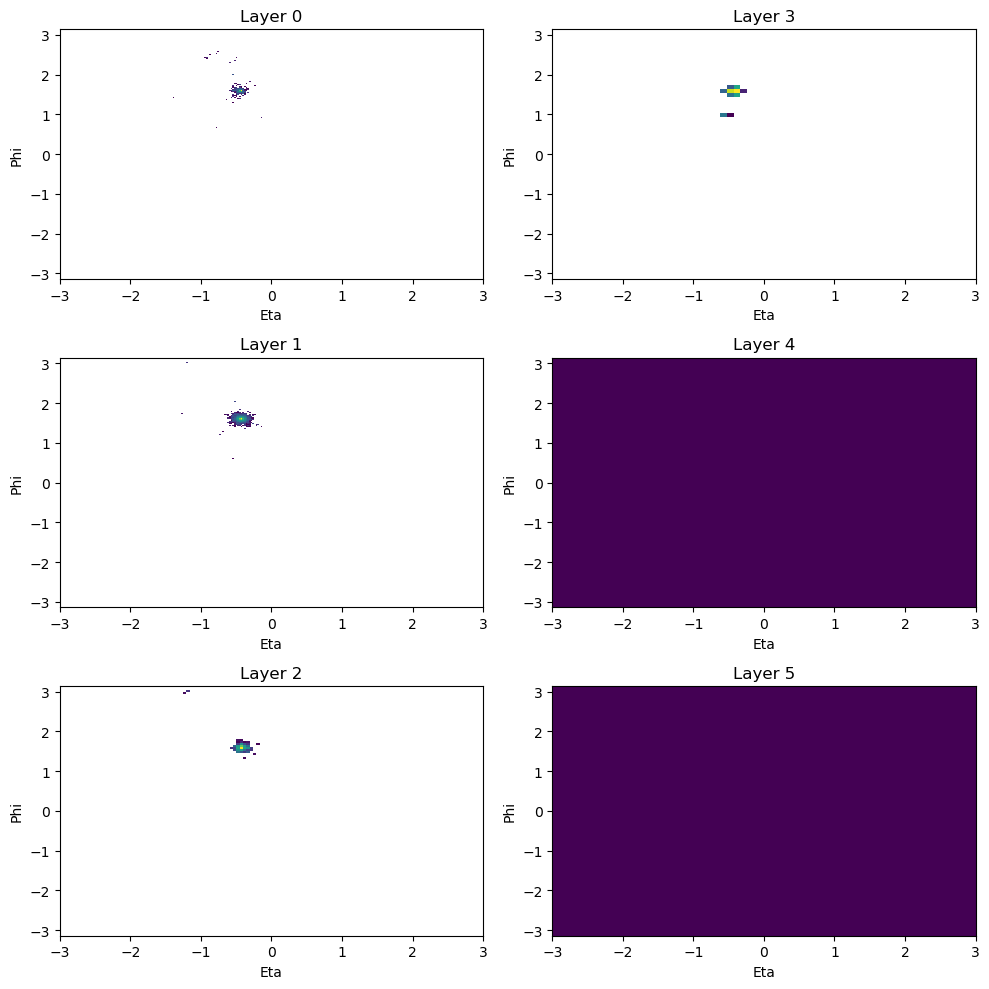

In [45]:
fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(3, 2)

for layer in range(6):
    ax = fig.add_subplot(gs[layer%3, layer//3])
    ax.set_title(f'Layer {layer}')
    eta_bins = np.linspace(-3,3,pixels_per_layer[layer])
    phi_bins = np.linspace(-np.pi,np.pi,pixels_per_layer[layer])
    mask = (cell_df['R_Bin'] == layer) & (cell_df['eDep'] > 0.5)
    ax.hist2d(cell_df[mask]['EtaPos'], cell_df[mask]['PhiPos'], bins=[eta_bins, phi_bins], weights=cell_df[mask]['eDep'], norm=LogNorm())
    ax.set_xlim(-3, 3)
    ax.set_ylim(-np.pi, np.pi)
    ax.set_xlabel('Eta')
    ax.set_ylabel('Phi')

plt.tight_layout()

In [ ]:
cell_df['log(eDep)'] = np.log(cell_df['eDep'])
cell_df['log(eDep)'] = (cell_df['log(eDep)'] - cell_df['log(eDep)'].min()) / (cell_df['log(eDep)'].max() - cell_df['log(eDep)'].min())

In [46]:
### 3-d plot of x,y,z using plotly
mask = (cell_df['eDep'] > 1)
fig = px.scatter_3d(cell_df[mask], x='XPos', y='YPos', z='ZPos', size='eDep', color='eDep', opacity=0.5, size_max=30,
                    hover_data=['eDep', 'parentID', 'volumeName', 'EtaPos', 'PhiPos']
                    )

### set the range of the x, y, z axis
fig.update_layout(scene=dict(xaxis=dict(range=[-4000, 4000]), yaxis=dict(range=[-4000, 4000]), zaxis=dict(range=[-6000, 6000])))

### remove the white outline around the markers
fig.update_traces(marker=dict(line=dict(width=0)))

### set the aspect ratio of the plot
fig.update_layout(scene_aspectmode='manual', scene_aspectratio=dict(x=2, y=2, z=3))

### make the canvas larger
fig.update_layout(width=1600, height=800)

fig.show()
fig.write_html(cell_file.replace('.csv', '.html'))

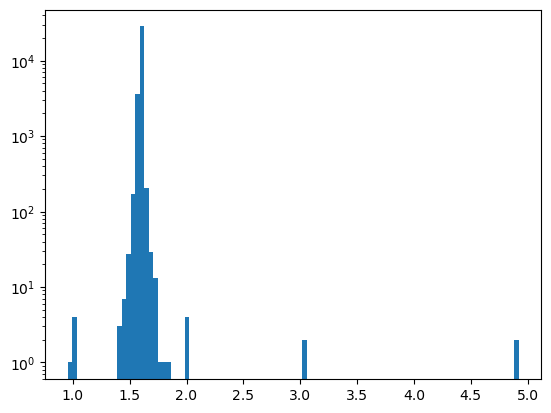

In [23]:
fig, ax = plt.subplots()
ax.hist(cell_df[mask]['PhiPos'] , bins=100)
ax.set_yscale('log')